 # Dog face detection with YOLOv8 and KerasCV

 This notebook demonstrates an object detection pipeline using YOLOv8 for dog face detection. It includes data preparation, preprocessing, augmentation, model creation, training and evaluation of the model.


## 1. Importing Libraries
We import the necessary libraries for the project, which will allow us to access the functions and classes we will use.

In [1]:
# Import necessary libraries

# Standard library imports
import glob
import os
import shutil
from pathlib import Path
import matplotlib.pyplot as plt
from typing import Callable, Dict

# Third-party imports
import cv2
import keras_cv
import tensorflow as tf

# Ensure that images display correctly in the notebook
%matplotlib inline

## 2. Setting Constants and Checking Hardware
In this section, we define constants like batch size and check if GPUs are available.

In [2]:
# Constants
BATCH_SIZE = 16
AUTO = tf.data.AUTOTUNE

In [3]:
print("Available GPUs:", len(tf.config.list_physical_devices('GPU')))

Available GPUs: 2


## 3. Data Preparation

We will define the directory structure for our dataset and copy the necessary data into these directories. This setup organizes the training and validation images and labels in a way that is compatible with the YOLOv8 model.

In [4]:
# Define the dataset directory structure
dataset_dirs = {
    'train_images': '/kaggle/working/dataset/images/train',
    'val_images': '/kaggle/working/dataset/images/val',
    'train_labels': '/kaggle/working/dataset/labels/train',
    'val_labels': '/kaggle/working/dataset/labels/val'
}

# Create directories if they do not exist
for dir_path in dataset_dirs.values():
    Path(dir_path).mkdir(parents=True, exist_ok=True)

We define a function to copy data from the input directories to the dataset directories:

In [5]:
# Copy data from input directory to the dataset directories
def copy_data(src_pattern: str, dest_dir: str) -> None:
    """
    Copies files from the source pattern to the destination directory.

    Args:
        src_pattern (str): Pattern matching the source files (e.g., using glob).
        dest_dir (str): Destination directory where the files will be copied.
    Returns:
        None
    """
    for file_path in glob.glob(src_pattern):
        shutil.copy(file_path, dest_dir)

Now, we use this function to copy the training and validation images and labels:

In [6]:
# Copy training and validation images and labels
copy_data('/kaggle/input/dog-face-detectionyolo-format/train_img/*', dataset_dirs['train_images'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/train_label/*', dataset_dirs['train_labels'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/val_img/*', dataset_dirs['val_images'])
copy_data('/kaggle/input/dog-face-detectionyolo-format/val_label/*', dataset_dirs['val_labels'])

Next, we define the dataset paths for the training and validation sets and print the dataset structure for verification:

In [7]:
# Define dataset paths for training and validation sets
train_img_dir = dataset_dirs['train_images']
train_label_dir = dataset_dirs['train_labels']
val_img_dir = dataset_dirs['val_images']
val_label_dir = dataset_dirs['val_labels']

# Print if path exists
print("Train images exist:", os.path.exists(train_img_dir))
print("Train labels exist:", os.path.exists(train_label_dir))
print("Validation images exist:", os.path.exists(val_img_dir))
print("Validation labels exist:", os.path.exists(val_label_dir))

Train images exist: True
Train labels exist: True
Validation images exist: True
Validation labels exist: True


## 4. Data Preprocessing
 
This section involves preprocessing the dataset by converting annotations to a usable format, creating lists of image paths, and converting data into a structured format.

In [8]:
# Function to convert annotation from txt file to list
def parse_txt_annotation(img_path: str, txt_path: str) -> tuple[str, list, list]:
    """
    Convert annotations from a txt file to a list.

    Args:
        img_path (str): Path to the image.
        txt_path (str): Path to the annotation file.

    Returns:
        tuple: (img_path, classes, boxes)
            img_path (str): Path to the image.
            classes (list): List of class labels for each detected object.
            boxes (list): List of bounding boxes for each object, represented as [xmin, ymin, xmax, ymax].
    """
    img = cv2.imread(img_path)  # Load image using OpenCV
    w = int(img.shape[1])  # Get image width
    h = int(img.shape[0])  # Get image height
    
    # Read annotation file
    file_label = open(txt_path, "r")
    lines = file_label.read().split('\n')
    
    boxes = []
    classes = []
    
    # Check if annotation file is empty
    if lines[0] == '':
        return img_path, classes, boxes
    else:
        for i in range(0, len(lines)):
            # Skip empty lines to avoid errors
            if lines[i].strip() == '':
                continue
            objbud = lines[i].split(' ')
            class_ = int(objbud[0])  # Get class label
            
            x1 = float(objbud[1])  # Get x-center of bounding box (normalized)
            y1 = float(objbud[2])  # Get y-center of bounding box (normalized)
            w1 = float(objbud[3])  # Get width of bounding box (normalized)
            h1 = float(objbud[4])  # Get height of bounding box (normalized)
            
            # Calculate the corners of the bounding box in absolute pixel values
            xmin = int((x1 * w) - (w1 * w) / 2.0)
            ymin = int((y1 * h) - (h1 * h) / 2.0)
            xmax = int((x1 * w) + (w1 * w) / 2.0)
            ymax = int((y1 * h) + (h1 * h) / 2.0)
    
            boxes.append([xmin, ymin, xmax, ymax])  # Append bounding box
            classes.append(class_)  # Append class label
            
    return img_path, classes, boxes

In [9]:
# Function to create a list of file paths
def create_paths_list(path: str) -> list:
    """
    Create a list of file paths for all files in the given directory.

    Args:
        path (str): Directory path containing the files.

    Returns:
        list: List of full file paths for each file in the directory.
    """
    full_path = []
    images = sorted(os.listdir(path))  # List all files in directory and sort them
    
    # Create full paths for each image file
    for i in images:
        full_path.append(os.path.join(path, i))
        
    return full_path

In [10]:
# Define class ids and mapping for bounding box labels
class_ids = ['dog_face']
class_mapping = dict(zip(range(len(class_ids)), class_ids))

print(class_mapping)

{0: 'dog_face'}


In [11]:
# Function to create image and annotation lists in a structured format
def creating_files(img_files_paths: str, annot_files_paths: str) -> tuple[tf.RaggedTensor, tf.RaggedTensor, tf.RaggedTensor]:
    """
    Create lists of image paths, class labels, and bounding boxes.

    Args:
        img_files_paths (str): Path to the images directory.
        annot_files_paths (str): Path to the annotations directory.

    Returns:
        tuple: (image_paths, classes, bbox)
            image_paths (tf.RaggedTensor): Ragged tensor of image paths.
            classes (tf.RaggedTensor): Ragged tensor of class labels.
            bbox (tf.RaggedTensor): Ragged tensor of bounding boxes.
    """
    img_files = create_paths_list(img_files_paths)  # Get list of image paths
    annot_files = create_paths_list(annot_files_paths)  # Get list of annotation paths
    
    image_paths = []
    bbox = []
    classes = []
    
    # Loop through each image and annotation file to parse and collect information
    for i in range(0, len(img_files)):
        image_path_, classes_, bbox_ = parse_txt_annotation(img_files[i], annot_files[i])
        image_paths.append(image_path_)
        bbox.append(bbox_)
        classes.append(classes_)
        
    # Convert lists to RaggedTensor for TensorFlow compatibility
    image_paths = tf.ragged.constant(image_paths)
    bbox = tf.ragged.constant(bbox)
    classes = tf.ragged.constant(classes)
    
    return image_paths, classes, bbox

In [12]:
# Applying functions to create datasets
train_img_paths, train_classes, train_bboxes = creating_files(train_img_dir, train_label_dir)

valid_img_paths, valid_classes, valid_bboxes = creating_files(val_img_dir, val_label_dir)

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


## 5. Data Augmentation and Preprocessing
 
Here, we define the preprocessing function for images and create augmenters to increase dataset diversity during training.

In [13]:
# Function to preprocess and resize images
def img_preprocessing(img_path: str) -> tf.Tensor:
    """
    Preprocess and resize images by reading, decoding, and casting them.

    Args:
        img_path (str): Path to the image.

    Returns:
        tf.Tensor: Preprocessed image tensor.
    """
    img = tf.io.read_file(img_path)  # Read image from file
    img = tf.image.decode_jpeg(img, channels=3)  # Decode JPEG image into tensor
    img = tf.cast(img, tf.float32)  # Convert image to float32 type
    
    return img

In [14]:
# Function to load datasets from paths, classes, and bounding boxes
def load_ds(img_paths: str, classes: list, bbox: list) -> dict:
    """
    Load and preprocess an image along with its corresponding classes and bounding boxes.

    Args:
        img_paths (str): Path to the image file.
        classes (list): List of class labels for objects in the image.
        bbox (list): List of bounding boxes, where each bounding box is defined by coordinates.

    Returns:
        dict: A dictionary containing:
            - 'images': Preprocessed image tensor.
            - 'bounding_boxes': A dictionary containing:
                - 'classes': Class labels (as tf.float32).
                - 'boxes': Bounding box coordinates.
    """
    # Preprocess the image using a custom preprocessing function
    img = img_preprocessing(img_paths)
    
    # Prepare bounding boxes and convert class labels to float32 for compatibility
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),  # Convert class labels to float32
        "boxes": bbox  # List of bounding boxes
    }
    
    # Return dictionary containing images and bounding boxes
    return {"images": img, "bounding_boxes": bounding_boxes}

In [15]:
def dict_to_tuple(inputs: dict) -> tuple[tf.Tensor, dict]:
    """
    Convert dictionary inputs to tuple format.

    Args:
        inputs (dict): Dictionary containing 'images' and 'bounding_boxes'.

    Returns:
        tuple: (images, bounding_boxes)
            images (tf.Tensor): Image tensor.
            bounding_boxes (dict): Bounding box dictionary containing 'classes' and 'boxes'.
    """
    return inputs["images"], inputs["bounding_boxes"]

### Data Augmentation
 
Augmenters are used to introduce variations in the dataset during training, such as random flipping and resizing.

In [16]:
augmenters = [
    keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xyxy"),
    keras_cv.layers.JitteredResize(
        target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xyxy"
    ),
]

def create_augmenter_fn(augmenters: list) -> Callable[[Dict], Dict]:
    """
    Create an augmenter function that applies multiple augmentations sequentially.

    Args:
        augmenters (list): List of augmentation layers to be applied.

    Returns:
        function: A function that takes inputs and applies all augmentations.
    """
    def augmenter_fn(inputs: Dict) -> Dict:
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn

augmenter_fn = create_augmenter_fn(augmenters)

In [17]:
# Define resizing layer for data augmentation
inference_resizing = keras_cv.layers.Resizing(
    height=640,  # Resize image height to 640 pixels
    width=640,   # Resize image width to 640 pixels
    pad_to_aspect_ratio=True,  # Pad the image to maintain aspect ratio
    bounding_box_format="xyxy"  # Bounding box format for boxes (e.g., [x_min, y_min, x_max, y_max])
)

## 6. Creating the Dataset for Training and Validation

We create the training and validation datasets using `tf.data.Dataset`, apply data augmentation, batching, and prefetching for performance.

In [18]:
# Creating dataset loaders and tf.data.Datasets

# Training dataset loader
train_loader = tf.data.Dataset.from_tensor_slices(
    (train_img_paths, train_classes, train_bboxes)
)  # Create dataset from tensor slices

train_dataset = (
    train_loader
    .map(load_ds, num_parallel_calls=AUTO)  # Map preprocessing function to dataset
    .shuffle(BATCH_SIZE * 10)  # Shuffle dataset with buffer size BATCH_SIZE * 10
    .ragged_batch(BATCH_SIZE, drop_remainder=True)  # Batch dataset with ragged tensor support
    .map(augmenter_fn, num_parallel_calls=AUTO)  # Apply resizing for data augmentation
    .map(dict_to_tuple, num_parallel_calls=AUTO)  # Convert dictionary to tuple format
    .prefetch(AUTO)  # Prefetch for performance
)

# Validation dataset loader
valid_loader = tf.data.Dataset.from_tensor_slices(
    (valid_img_paths, valid_classes, valid_bboxes)
)  # Create dataset from tensor slices for validation set

valid_dataset = (
    valid_loader
    .map(load_ds, num_parallel_calls=AUTO)  # Map preprocessing function to validation dataset
    .ragged_batch(BATCH_SIZE, drop_remainder=True)  # Batch dataset with ragged tensor support
    .map(inference_resizing, num_parallel_calls=AUTO)  # Apply resizing for validation data
    .map(dict_to_tuple, num_parallel_calls=AUTO)  # Convert dictionary to tuple format
    .prefetch(AUTO)  # Prefetch for performance
)

## 7. Visualizing the Dataset

Let's visualize some of the images and annotations to better understand the dataset.

In [19]:
# Function to visualize samples from a dataset
def visualize_dataset(
    inputs: tf.data.Dataset,
    value_range: tuple[int, int],
    rows: int,
    cols: int,
    bounding_box_format: str
) -> None:
    """
    Visualize samples from a dataset by plotting images and their corresponding bounding boxes.

    Args:
        inputs (tf.data.Dataset): Input dataset containing images and bounding boxes.
        value_range (tuple): Range of values for images (min, max).
        rows (int): Number of rows in the visualization grid.
        cols (int): Number of columns in the visualization grid.
        bounding_box_format (str): Format of bounding boxes (e.g., "xyxy").

    Returns:
        None
    """
    # Take one batch from the dataset
    inputs = next(iter(inputs.take(1)))
    
    # Extract images and bounding boxes from the batch
    images, bounding_boxes = inputs[0], inputs[1]
    
    # Plot bounding box gallery for visualization
    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=6,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
        true_color=(192, 57, 43)
    )

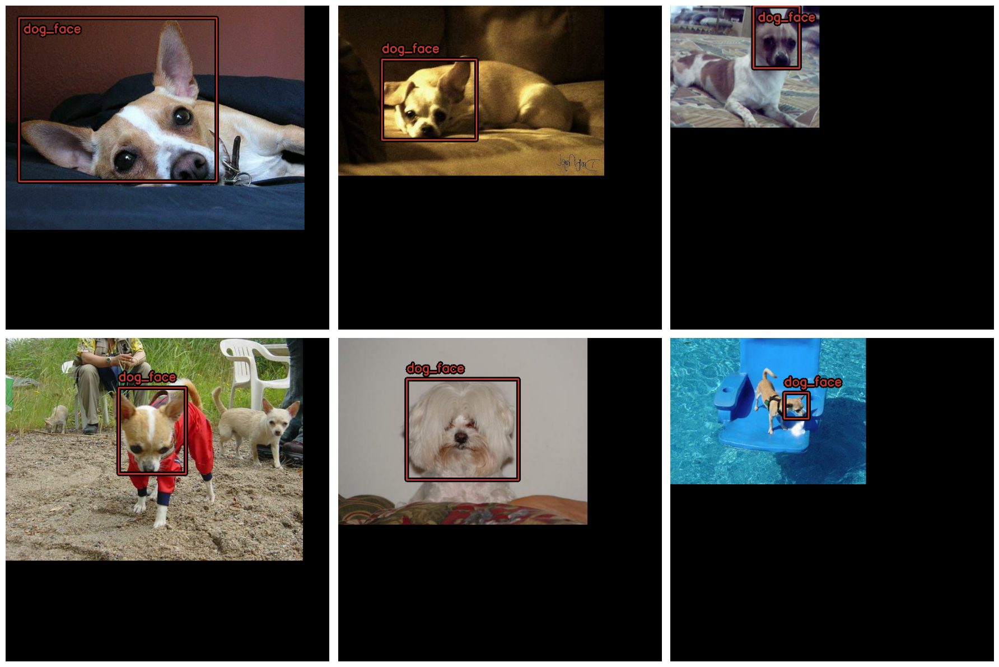

In [20]:
# Visualize example images and annotations from the training dataset
visualize_dataset(
    inputs=train_dataset, 
    bounding_box_format="xyxy", 
    value_range=(0, 255), 
    rows=2, 
    cols=3
)

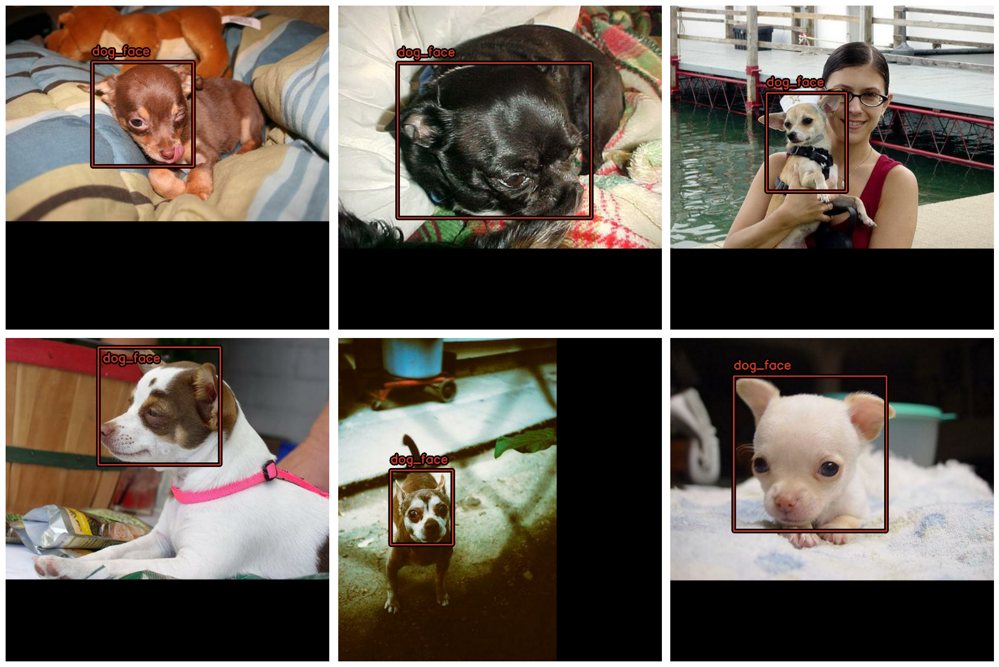

In [21]:
# Visualize example images and annotations from the validation dataset
visualize_dataset(
    inputs=valid_dataset, 
    bounding_box_format="xyxy", 
    value_range=(0, 255), 
    rows=2, 
    cols=3
)

## 8. YOLOv8 Model Creation
 
We define the YOLOv8 model architecture, configure the backbone, and compile the model with an appropriate optimizer and loss functions.

In [22]:
# YOLO V8 Model
# Creating mirrored strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()

In [23]:
# All model and optimizer definitions should be within the scope of the strategy
with strategy.scope():
    # Load the YOLOV8 backbone preset with included rescaling
    backbone = keras_cv.models.YOLOV8Backbone.from_preset(
        "yolo_v8_s_backbone_coco", include_rescaling=True
    )
    
    # Initialize the YOLOV8Detector model with the specified backbone
    model = keras_cv.models.YOLOV8Detector(
        num_classes=len(class_mapping),  # Number of classes in your dataset
        bounding_box_format="xyxy",  # Format of the bounding boxes
        backbone=backbone,  # The backbone model to use
        fpn_depth=5  # Depth of the Feature Pyramid Network
    )
    
    # Define the optimizer with learning rate and weight decay
    optimizer = tf.keras.optimizers.AdamW(
        learning_rate=1e-4,  # Learning rate for the optimizer
        weight_decay=1e-3  # Weight decay for regularization
    )
    
    # Compile the model with appropriate loss functions for classification and bounding box regression
    model.compile(
        optimizer=optimizer, 
        classification_loss='binary_crossentropy', 
        box_loss='ciou',
    )

## 9. Model Training
 
In this section, we define callbacks for saving the best model and stopping early, then train the model on the training set.

In [24]:
# Define callbacks to use during training
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='/kaggle/working/yolo_dog_face_detection.weights.h5',  # Filepath to save the best model weights
        monitor='val_loss',  # Monitor validation loss to determine the best model
        save_best_only=True,  # Save only the best model
        save_weights_only=True  # Save only the model weights, not the entire model
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',  # Monitor validation loss to decide when to stop training
        patience=5,  # Number of epochs with no improvement after which training will be stopped
        verbose=1  # Verbosity mode
    )
]

# Train the model on the training dataset and validate on the validation dataset
history = model.fit(
    train_dataset,  # Training data
    validation_data=valid_dataset,  # Validation data
    epochs=45,  # Number of epochs to train
    callbacks=callbacks  # List of callbacks to apply during training
)

Epoch 1/45
181/370 ━━━━━━━━━━━━━━━━━━━━ 2:06 670ms/step - loss: 379.6146

Corrupt JPEG data: premature end of data segment


194/370 ━━━━━━━━━━━━━━━━━━━━ 1:58 671ms/step - loss: 369.9008

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 441s 706ms/step - loss: 289.0175 - val_loss: 84.8135
Epoch 2/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 683ms/step - loss: 86.9608

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 683ms/step - loss: 86.5833

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 687ms/step - loss: 80.8733 - val_loss: 46.1176
Epoch 3/45
181/370 ━━━━━━━━━━━━━━━━━━━━ 2:08 681ms/step - loss: 44.5381

Corrupt JPEG data: premature end of data segment


194/370 ━━━━━━━━━━━━━━━━━━━━ 1:59 680ms/step - loss: 44.3685

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 687ms/step - loss: 41.9540 - val_loss: 29.3408
Epoch 4/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:11 686ms/step - loss: 26.5586

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 685ms/step - loss: 26.4889

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 690ms/step - loss: 25.3764 - val_loss: 18.8177
Epoch 5/45
181/370 ━━━━━━━━━━━━━━━━━━━━ 2:08 680ms/step - loss: 17.8175

Corrupt JPEG data: premature end of data segment


194/370 ━━━━━━━━━━━━━━━━━━━━ 1:59 679ms/step - loss: 17.7808

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 17.2149 - val_loss: 13.6114
Epoch 6/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 682ms/step - loss: 13.0307

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 681ms/step - loss: 13.0096

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 687ms/step - loss: 12.6605 - val_loss: 10.8703
Epoch 7/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 678ms/step - loss: 10.1674

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 677ms/step - loss: 10.1548

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 684ms/step - loss: 9.9289 - val_loss: 8.4048
Epoch 8/45
181/370 ━━━━━━━━━━━━━━━━━━━━ 2:08 680ms/step - loss: 8.2143

Corrupt JPEG data: premature end of data segment


194/370 ━━━━━━━━━━━━━━━━━━━━ 1:59 679ms/step - loss: 8.1973

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 7.9820 - val_loss: 6.6662
Epoch 9/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 680ms/step - loss: 6.6023

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 679ms/step - loss: 6.5902

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 6.4158 - val_loss: 5.8016
Epoch 10/45
180/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 685ms/step - loss: 5.3933

Corrupt JPEG data: premature end of data segment


193/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 684ms/step - loss: 5.3827

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 689ms/step - loss: 5.2429 - val_loss: 4.7210
Epoch 11/45
180/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 681ms/step - loss: 4.5128

Corrupt JPEG data: premature end of data segment


193/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 681ms/step - loss: 4.5046

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 687ms/step - loss: 4.3918 - val_loss: 4.1508
Epoch 12/45
181/370 ━━━━━━━━━━━━━━━━━━━━ 2:08 680ms/step - loss: 3.8726

Corrupt JPEG data: premature end of data segment


194/370 ━━━━━━━━━━━━━━━━━━━━ 1:59 679ms/step - loss: 3.8679

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 3.7878 - val_loss: 3.4281
Epoch 13/45
180/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 686ms/step - loss: 3.4322

Corrupt JPEG data: premature end of data segment


193/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 685ms/step - loss: 3.4260

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 689ms/step - loss: 3.3370 - val_loss: 3.0885
Epoch 14/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 682ms/step - loss: 3.0563

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 682ms/step - loss: 3.0523

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 687ms/step - loss: 2.9790 - val_loss: 2.7737
Epoch 15/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 682ms/step - loss: 2.7916

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 682ms/step - loss: 2.7881

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 2.7161 - val_loss: 2.6502
Epoch 16/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 680ms/step - loss: 2.6063

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 679ms/step - loss: 2.6008

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 685ms/step - loss: 2.5221 - val_loss: 2.5021
Epoch 17/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 682ms/step - loss: 2.4189

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 683ms/step - loss: 2.4153

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 688ms/step - loss: 2.3507 - val_loss: 2.2351
Epoch 18/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 679ms/step - loss: 2.2809

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 679ms/step - loss: 2.2780

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 254s 682ms/step - loss: 2.2201 - val_loss: 2.2816
Epoch 19/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 679ms/step - loss: 2.2014

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 680ms/step - loss: 2.1975

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 685ms/step - loss: 2.1270 - val_loss: 2.1764
Epoch 20/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 680ms/step - loss: 2.0862

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 679ms/step - loss: 2.0834

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 2.0219 - val_loss: 2.0380
Epoch 21/45
180/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 680ms/step - loss: 2.0123

Corrupt JPEG data: premature end of data segment


193/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 679ms/step - loss: 2.0100

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 685ms/step - loss: 1.9503 - val_loss: 1.9993
Epoch 22/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 685ms/step - loss: 1.9816

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 684ms/step - loss: 1.9782

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 685ms/step - loss: 1.9111 - val_loss: 2.0409
Epoch 23/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:10 681ms/step - loss: 1.9383

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:01 681ms/step - loss: 1.9345

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 254s 682ms/step - loss: 1.8677 - val_loss: 2.0062
Epoch 24/45
176/370 ━━━━━━━━━━━━━━━━━━━━ 2:12 681ms/step - loss: 1.8959

Corrupt JPEG data: premature end of data segment


189/370 ━━━━━━━━━━━━━━━━━━━━ 2:03 680ms/step - loss: 1.8936

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 257s 688ms/step - loss: 1.8308 - val_loss: 1.8940
Epoch 25/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:11 687ms/step - loss: 1.8699

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 685ms/step - loss: 1.8667

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 685ms/step - loss: 1.7971 - val_loss: 1.9263
Epoch 26/45
175/370 ━━━━━━━━━━━━━━━━━━━━ 2:12 681ms/step - loss: 1.8530

Corrupt JPEG data: premature end of data segment


188/370 ━━━━━━━━━━━━━━━━━━━━ 2:03 680ms/step - loss: 1.8507

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 685ms/step - loss: 1.7800 - val_loss: 1.8003
Epoch 27/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 680ms/step - loss: 1.8196

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 679ms/step - loss: 1.8158

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 256s 686ms/step - loss: 1.7449 - val_loss: 1.7656
Epoch 28/45
179/370 ━━━━━━━━━━━━━━━━━━━━ 2:11 690ms/step - loss: 1.7871

Corrupt JPEG data: premature end of data segment


192/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 689ms/step - loss: 1.7845

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 258s 688ms/step - loss: 1.7186 - val_loss: 1.9364
Epoch 29/45
180/370 ━━━━━━━━━━━━━━━━━━━━ 2:09 679ms/step - loss: 1.7586

Corrupt JPEG data: premature end of data segment


193/370 ━━━━━━━━━━━━━━━━━━━━ 2:00 679ms/step - loss: 1.7561

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 684ms/step - loss: 1.6935 - val_loss: 1.8746
Epoch 30/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:11 685ms/step - loss: 1.7461

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 684ms/step - loss: 1.7426

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 684ms/step - loss: 1.6751 - val_loss: 1.8713
Epoch 31/45
174/370 ━━━━━━━━━━━━━━━━━━━━ 2:13 680ms/step - loss: 1.7659

Corrupt JPEG data: premature end of data segment


187/370 ━━━━━━━━━━━━━━━━━━━━ 2:04 680ms/step - loss: 1.7621

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 254s 682ms/step - loss: 1.6825 - val_loss: 1.8414
Epoch 32/45
178/370 ━━━━━━━━━━━━━━━━━━━━ 2:11 685ms/step - loss: 1.7047

Corrupt JPEG data: premature end of data segment


191/370 ━━━━━━━━━━━━━━━━━━━━ 2:02 684ms/step - loss: 1.7023

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


370/370 ━━━━━━━━━━━━━━━━━━━━ 255s 684ms/step - loss: 1.6354 - val_loss: 1.8488
Epoch 32: early stopping


### Visualizing Training Loss
 
We plot the training and validation losses to observe the training progress.

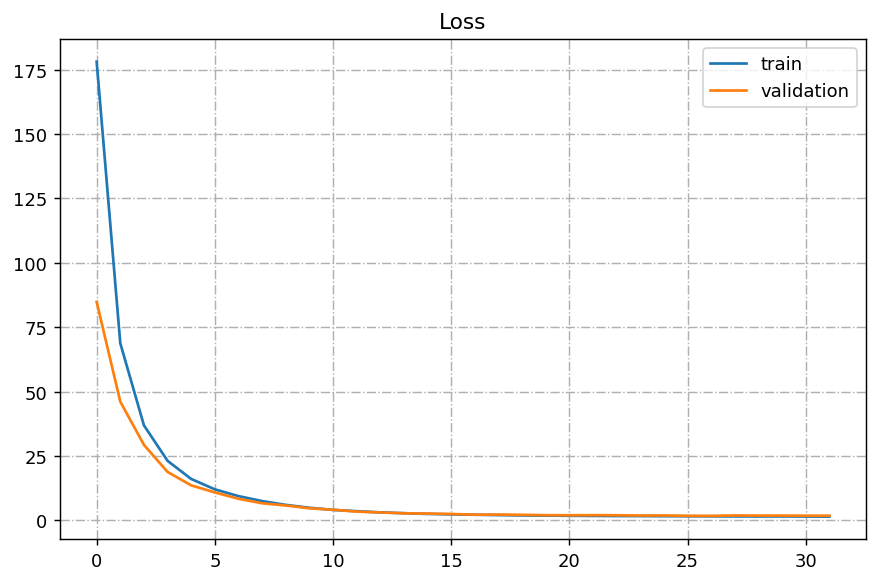

In [25]:
plt.figure(figsize=(8, 5), dpi=130)
plt.grid(linestyle="dashdot")
plt.title("Loss")
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(["train", "validation"])
plt.show()

## 10. Model Evaluation and Prediction
 
Finally, we evaluate the trained model on the validation set and visualize predictions.

In [26]:
model.load_weights('/kaggle/working/yolo_dog_face_detection.weights.h5')

In [27]:
results = model.evaluate(valid_dataset)
print(f"Evaluation results loss: {results}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 1.8812
Evaluation results loss: 1.765648603439331


In [28]:
def visualize_predict_detections(model: tf.keras.Model, dataset: tf.data.Dataset, bounding_box_format: str, rows: int, cols: int) -> None:
    """
    Visualize predictions made by the model on a given dataset.

    Args:
        model (tf.keras.Model): Trained YOLO model.
        dataset (tf.data.Dataset): Dataset containing images for prediction.
        bounding_box_format (str): Format of bounding boxes (e.g., "xyxy").
        rows (int): Number of rows to show.
        cols (int): Number of cols to show.

    Returns:
        None
    """
    images, y_true = next(iter(dataset.take(1)))

    y_pred = model.predict(images, verbose=0)
    # y_pred = keras_cv.bounding_box.to_ragged(y_pred)
    
    keras_cv.visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        true_color=(192, 57, 43),
        pred_color=(255, 235, 59),
        scale=8,
        font_scale=0.8,
        line_thickness=2,
        dpi=100,
        rows=rows,
        cols=cols,
        show=True,
        class_mapping=class_mapping,
    )


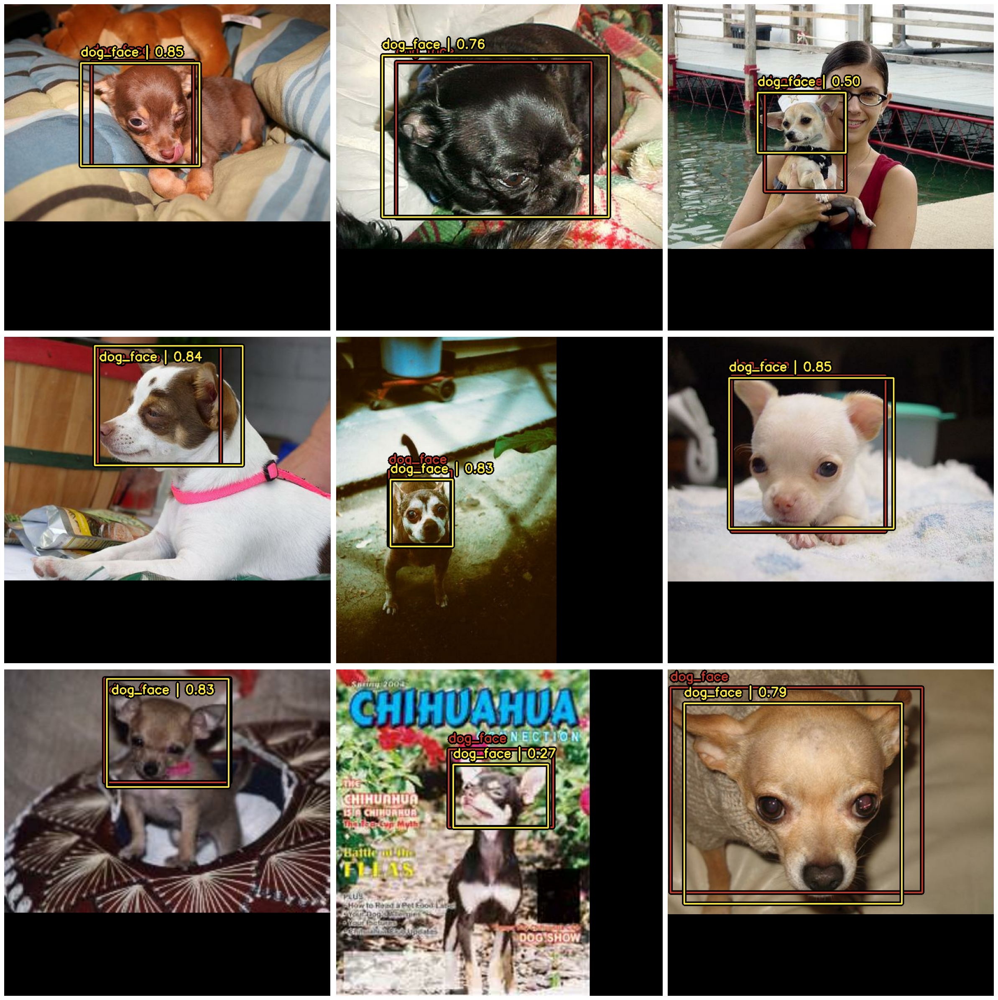

In [29]:
visualize_predict_detections(model, dataset=valid_dataset, bounding_box_format="xyxy", rows=3, cols=3)